# Sonoma Water Mesh Creation

Base mesh for a first iteration of a Sonoma Water Simulation

In [1]:
%matplotlib ipympl
%load_ext autoreload
%autoreload 2

In [2]:
## Importing all the package needed to run teh watershed workflow
# conda package imports
import logging

import os,sys
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
pd.set_option('display.max_columns', None) 
import geopandas as gpd
import shapely
import xarray as xr
import cftime

import copy
import pickle

import watershed_workflow 
import watershed_workflow.sources
import watershed_workflow.ui
import watershed_workflow.utils
import watershed_workflow.plot
import watershed_workflow.mesh
import watershed_workflow.regions
import watershed_workflow.land_cover_properties
import watershed_workflow.resampling
import watershed_workflow.condition
import watershed_workflow.io
watershed_workflow.ui.setup_logging(1,None)

In [3]:
# Parameters cell -- this provides all parameters that can be changed via pipelining to generate a new watershed.
name = 'RussianRiver' # name the domain, used in filenames, etc
hucs = ['18010110'] # a list of HUCs to run
huc_level = 8 # if provided, an int setting the level at which to include HUC boundaries
modis_name = None

# geometry
stream_outlet_width = 500 # half-width to track a labeled set on which to get discharge
num_smoothing_sweeps = 5 # number of times to smooth the DEM prior to elevating

# simulation control
start_year = 2010  # year to start and end simulation simulation -- note these start and end Oct 1 of the year
end_year = 2020
min_porosity = 0.05 # minimum porosity considered too small
max_permeability = 1.e-10 # max value allowed for permeability
max_vg_alpha = 1.e-3 # max value of van Genuchten's alpha -- our correlation is not valid for some soils


production = False

if production:
    ## PRODUCTION
    # geometric parameters
    simplify_hucs = 250
    simplify_rivers = 100
    prune_by_area = 10 # km^2
    
    # triangle refinement control
    refine_d0 = 150 
    refine_d1 = 400
    refine_A0 = 10000
    refine_A1 = 50000

else:
    ## TESTING
    # geometric parameters
    simplify_hucs = 300
    simplify_rivers = 200
    prune_by_area = 10
    
    # triangle refinement control
    refine_d0 = 100
    refine_d1 = 400
    refine_A0 = 20000
    refine_A1 = 50000


# logistics
generate_plots = True # plots take time to make and aren't always needed
generate_daymet = True # potentially don't do Met data forcing
generate_modis = True

log_to_file = False  # if true, write to file instead of in the notebook output
figsize = (6,6)
figsize_3d = (8,6)

In [4]:
# parameter checking
assert(simplify_hucs > 0 and simplify_hucs <= 300)
assert(simplify_rivers > 0 and simplify_rivers <= 300)

assert(start_year >= 1980 and start_year < 2020)

if type(hucs) is str:
    assert(hucs[0] == '[')
    assert(hucs[-1] == ']')
    hucs = hucs[1:-1]
    hucs = hucs.split(',')
    hucs = [h.strip() for h in hucs]
    if hucs[-1] == '':
        hucs = hucs[:-1]

if huc_level is None:
    huc_level = len(hucs[0])
else:
    assert(huc_level >= len(hucs[0]))
huc_key = f'HUC{huc_level}'



In [5]:
# a dictionary of outputs -- will include all filenames generated
outputs = {}

In [6]:
# Note that, by default, we tend to work in the DayMet CRS because this allows us to avoid
# reprojecting meteorological forcing datasets.
crs = watershed_workflow.crs.daymet_crs

# Sources and setup

Next we set up the source watershed and coordinate system and all data sources for our mesh.  We will use the CRS that is included in the shapefile.

In [7]:
logging.info("")
logging.info(f"Meshing shape: {hucs}")
logging.info("="*30)


2025-07-15 20:23:44,213 - root - INFO: 
2025-07-15 20:23:44,213 - root - INFO: Meshing shape: ['18010110']
2025-07-15 20:23:44,214 - root - INFO: ==============================


A wide range of data sources are available; here we use the defaults except for using NHD Plus for watershed boundaries and hydrography (the default is NHD, which is lower resolution and therefore smaller download sizes).

In [8]:
# set up a dictionary of source objects
sources = watershed_workflow.sources.get_default_sources()
sources['hydrography'] = watershed_workflow.sources.hydrography_sources['NHDv2.1']
sources['HUC'] = watershed_workflow.sources.huc_sources['WaterData WBD']
#sources['DEM'] = watershed_workflow.sources.dem_sources['NED 1/3 arc-second']
watershed_workflow.sources.log_sources(sources)

2025-07-15 20:23:44,241 - root - INFO: Using sources:
2025-07-15 20:23:44,241 - root - INFO: --------------
2025-07-15 20:23:44,242 - root - INFO: HUC: WaterData
2025-07-15 20:23:44,242 - root - INFO: hydrography: WaterData
2025-07-15 20:23:44,242 - root - INFO: DEM: 3DEP


In [9]:
# load the huc
my_hucs = watershed_workflow.getShapesByID(sources['HUC'], hucs, crs, level=huc_level)
my_hucs

,geometry,tnmid,metasourceid,sourcedatadesc,sourceoriginator,sourcefeatureid,loaddate,gnis_id,areaacres,areasqkm,states,huc8,name,globalid,huc,area
ID,,,,,,,,,,,,,,,,
18010110,"POLYGON ((-1882267.587 -65810.936, -1882229.42...",{4FE6CEDE-BE3C-4334-837D-45CEBEF4C4A8},None,None,None,None,2012-06-11T07:54:56Z,None,950365.01,3845.99,CA,18010110,Russian,{83E57CD7-D4E7-440E-A34F-A5411F15742F},18010110,3845.99


# Generate the surface mesh

First we'll generate the flattened, 2D triangulation, which builds on hydrography data.  Then we download a digital elevation map from the National Elevation Dataset, and extrude that 2D triangulation to a 3D surface mesh based on interpolation between pixels of the DEM.

## Get river network

This will download the river network from the NHD Plus database, and simplify the network, constructing a tree-like data structure.

While constructing river, user should be intetntional with prune options to get desired river network density. It is recommended to not have too dense river network if not needed as each reach in the river tree will show up in quad mesh

In [10]:
# download/collect the river network within that shape's bounds
reaches = watershed_workflow.getShapesByGeometry(sources['hydrography'], my_hucs.geometry[0], crs, crs)

# remove coastlines
reaches = reaches[reaches.ftype != 'Coastline']
print(reaches.crs)

# construct rivers
rivers = watershed_workflow.river_tree.createRivers(reaches, method='hydroseq')
print(rivers[0].df.crs)

+proj=lcc +lat_1=25 +lat_2=60 +lat_0=42.5 +lon_0=-100 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs +type=crs
+proj=lcc +lat_1=25 +lat_2=60 +lat_0=42.5 +lon_0=-100 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs +type=crs


/Users/7s2/Softwares/watershed_workflow_geopandas_xarray/watershed_workflow/sources/manager_hyriver.py:62: UserWarning: 14 of 1624 requests failed.. IDs of the failed requests are ['8272727', '8268253', '8272689', '8272215', '8270561', '8272671', '8272961', '8272969', '8272667', '8272731', '8272017', '8270833', '8267989', '8272029']
  df = protocol.byid(self._id_name, ids)


2025-07-15 20:23:50,692 - root - INFO: Removing holes on 1 polygons
2025-07-15 20:23:50,693 - root - INFO:   -- removed interior
2025-07-15 20:23:50,693 - root - INFO:   -- union
2025-07-15 20:23:50,693 - root - INFO: Parsing 1 components for holes
2025-07-15 20:23:50,694 - root - INFO:   -- complete


<Axes: >

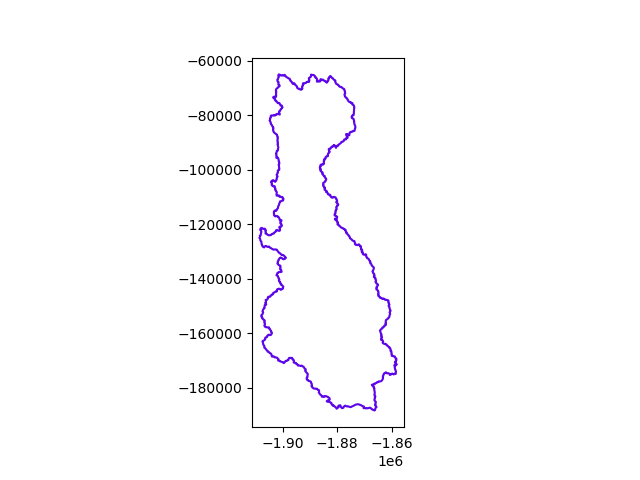

In [11]:
# redefine the watershed as the union of the HUC and the catchments of the river
assert len(rivers) == 1
ca = shapely.unary_union([r['catchment'] for r in rivers[0]])
my_hucs.geometry[0] = shapely.unary_union([ca, my_hucs.geometry[0]])

# create the split hucs object
watershed = watershed_workflow.split_hucs.SplitHUCs(my_hucs)
watershed.plot()

(-163500.0, -163000.0)

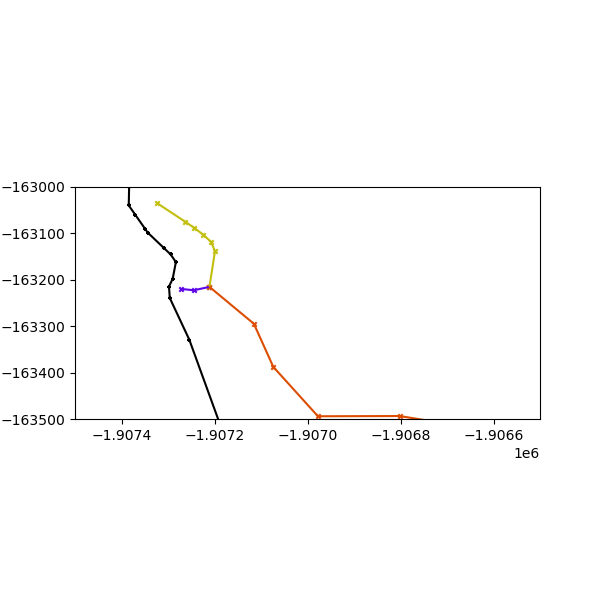

In [12]:
def plot(ws, rivs, ax=None):
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)
    ws.plot(color='k', marker='+', markersize=10, ax=ax)
    for river in rivs:
        river.plot(marker='x', markersize=10, ax=ax)

    return ax

ax = plot(watershed, rivers)


#ax.set_xlim([-1.91e6, -1.9e6])
#ax.set_ylim([-170000, -160000])

ax.set_xlim([-1.9075e6, -1.9065e6])
ax.set_ylim([-0.1635e6, -0.163e6])

In [13]:
# the outlet here needs to be modified thanks to the coastline reaches

# move the endpoint to the boundary
op = rivers[0].linestring.coords[-1]
cp = shapely.ops.nearest_points(watershed.exterior.exterior, rivers[0].linestring)[0]
print(op, cp)

rivers[0].moveCoordinate(-1, cp)

(-1907271.9899515102, -163219.72600177836) POINT (-1907297.4091249923 -163221.56188366894)


(-163500.0, -163000.0)

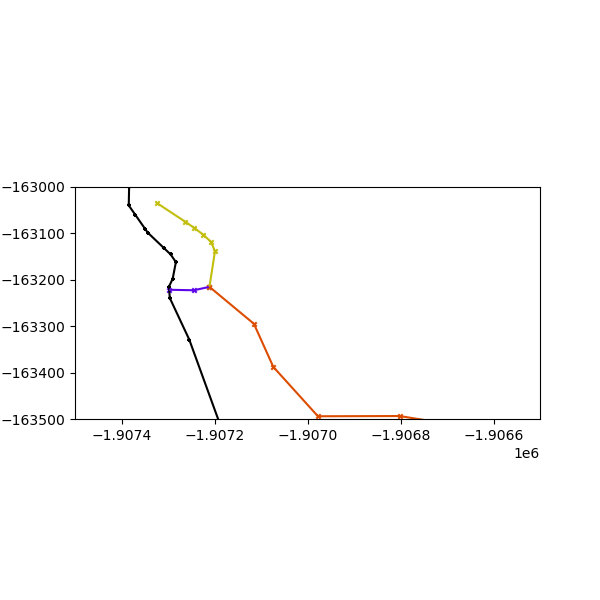

In [14]:
ax = plot(watershed, rivers)

ax.set_xlim([-1.9075e6, -1.9065e6])
ax.set_ylim([-0.1635e6, -0.163e6])

In [15]:
# keep the original objects for plotting comparisons
watershed_orig, rivers_orig = watershed, rivers

In [16]:
# keeping the originals for plotting comparisons
def createCopy(watershed, rivers):
    """To compare before/after, we often want to create copies.  Note in real workflows most things are done in-place without copies."""
    return watershed.deepcopy(), [r.deepcopy() for r in rivers]
    
watershed, rivers = createCopy(watershed_orig, rivers_orig)


In [17]:
# prune
rivers = watershed_workflow.reduceRivers(rivers, 
                                         prune_by_area=prune_by_area,
                                         remove_diversions=True,
                                         remove_braided_divergences=True)
print(rivers[0].df.crs)

2025-07-15 20:23:56,351 - root - INFO: Removing rivers with area < 10
2025-07-15 20:23:56,352 - root - INFO: Removing divergent sections...
2025-07-15 20:23:56,375 - root - INFO:   ... removed 29 divergence tributaries with 37 total reaches.
2025-07-15 20:23:56,838 - root - INFO: ... pruned 948 of 1583


+proj=lcc +lat_1=25 +lat_2=60 +lat_0=42.5 +lon_0=-100 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs +type=crs


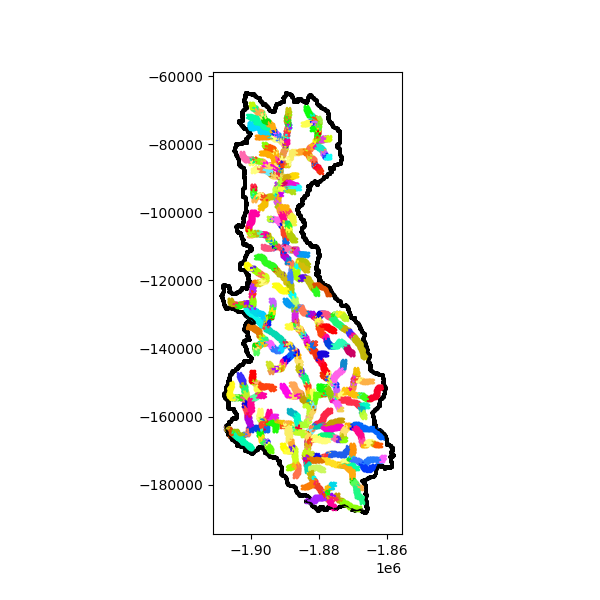

In [18]:
ax = plot(watershed, rivers)


In the simplification step below, we keep the original river so that we can sample vertices from these original dense rivers and huc boundaries to get vertex density at desired resolution.

Using the Douglas-Peucker algorithm, we simplify the flowline by removing non-essential vertices with shapely's "simplify" method, ensuring accurate representation. Additional simplifications, such as merging minor reaches and aligning watershed boundaries with flowlines, are also performed. 

TIPS:
- keep merge tolerance about 70% of the simplify_rivers tolerance
- use smaller snap tolerance (50% of simplify_rivers) if non-outlet reaches start snapping to the watershed boundaries


In step two, we enhance the flowline's resolution by adding nearly uniformly distributed vertices, sampled from the original to regain any curvature lost during simplification, with an upper user-defined limit dictating the distance between consecutive vertices, ultimately determining the quad length in the river mesh. When the distance in a reach linestring, represented as a shapely.LineString object, surpasses this scale, additional vertices are inserted, their number and coordinates derived using 1D interpolation from the original linestring vertices.

The limit of distance between vertices on the huc boundary is a function of distance from the river. Parts of huc linestrings close to river get vertices placd at higher density.

Sharp bends in the river and tributaries running closely before merging are a couple of cases that can constrain triangulation to yield small triangles. Hence, we smoothen out some of these sharp angles

TIPS:

    provide L0 about same as length scale limit on river and L1 about 1.5 to 2 times times length scale limit on river
    profile d1 atleast equal to length scale limit on river



In [19]:
# simplifying 
watershed_workflow.simplify(watershed, rivers, 
                            reach_segment_target_length=simplify_rivers,
                            huc_segment_target_length=simplify_hucs,
                            river_close_distance=100,
                            river_far_distance=1000)

# greatly shrunk the rivers... shrink the dataframe too
for river in rivers:
    river.resetDataFrame()

# Now that the river network is set, find the watershed boundary outlets
for river in rivers:
    watershed_workflow.hydrography.findOutletsByCrossings(watershed, river)


2025-07-15 20:23:57,758 - root - INFO: 
2025-07-15 20:23:57,759 - root - INFO: Simplifying
2025-07-15 20:23:57,759 - root - INFO: ------------------------------
2025-07-15 20:23:57,759 - root - INFO: +proj=lcc +lat_1=25 +lat_2=60 +lat_0=42.5 +lon_0=-100 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs +type=crs
2025-07-15 20:23:57,759 - root - INFO: Presimplify to remove colinear, coincident points.
2025-07-15 20:23:57,777 - root - INFO: +proj=lcc +lat_1=25 +lat_2=60 +lat_0=42.5 +lon_0=-100 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs +type=crs
2025-07-15 20:23:57,778 - root - INFO: Pruning leaf reaches < 200
2025-07-15 20:23:57,779 - root - INFO:   ...cleaned leaf linestring of length: 163.835 at centroid (-1899480.9637977155, -92272.04855064777)
2025-07-15 20:23:57,782 - root - INFO: +proj=lcc +lat_1=25 +lat_2=60 +lat_0=42.5 +lon_0=-100 +x_0=0 +y_0=0 +ellps=WGS84 +units=m +no_defs +type=crs
2025-07-15 20:23:57,783 - root - INFO: Merging internal reaches < 200
2025-07-15 20:23:57,785 - ro

In [20]:
# this should generate a zoomable map, showing different reaches and watersheds, 
# with discrete points.  Problem areas are clickable to get IDs for manual
# modifications.
m = watershed.explore(marker=False)
for river in rivers_orig:
    m = river.explore(m=m, column=None, color='black', name=river['name']+' raw', marker=False)
for river in rivers:
    m = river.explore(m=m, color='b')
    
m = watershed_workflow.makeMap(m)
m

In [21]:
# checkpoint here, saving both rivers and hucs to disk
#river_df = pd.concat([river.to_dataframe() for river in rivers], ignore_index=True)
#river_df.to_parquet(name + '_rivers.parquet')
#with open(name+'_watersheds.pickle', 'wb') as fid:
#    pickle.dump(watershed, fid)


## Tessalate from Rivers and HUCs to a Mesh

In [22]:
# if loading from a checkpoint, skip the previous subsection
#
# NOTE: this doesn't work quite yet?
#

#reaches_df = gpd.read_parquet(name+'_rivers.parquet')
#rivers = watershed_workflow.river_tree.createRivers(reaches_df, method='native')
#
#with open(name+'_watersheds.pickle', 'rb') as fid:
#    watershed = pickle.load(fid)
    

In [23]:
# how many types of Stream Orders are there
print(set([int(r.properties['stream_order']) for r in rivers[0]]))


{1, 2, 3, 4, 5}


Widths in the river corridor mesh (quads) is given through dictionary of Stream Order:Width. One way to get these values is to do a quick survey on GIS map and see for the given watershed, what are typical widths of different stream orders. Or, user may also provide width as a function of drainage area.  Or any other way of setting a width property on the reach. 

2025-07-15 20:24:08,172 - root - INFO: 
2025-07-15 20:24:08,172 - root - INFO: Stream-aligned Meshing
2025-07-15 20:24:08,172 - root - INFO: ------------------------------
2025-07-15 20:24:08,173 - root - INFO: Creating stream-aligned mesh...
2025-07-15 20:24:08,658 - root - INFO: Adjusting HUC to match reaches at outlet
2025-07-15 20:24:08,734 - root - INFO: Plotting the river mesh


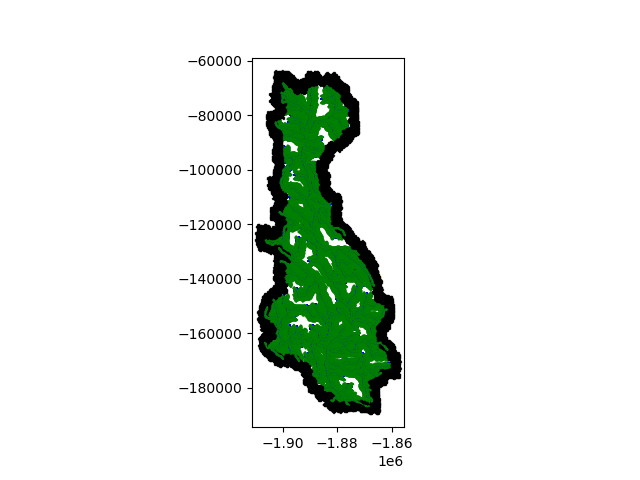

2025-07-15 20:24:31,815 - root - INFO: 
2025-07-15 20:24:31,815 - root - INFO: Triangulation
2025-07-15 20:24:31,815 - root - INFO: ------------------------------
2025-07-15 20:24:31,849 - root - INFO: Triangulating...
2025-07-15 20:24:31,870 - root - INFO:    13271 points and 13272 facets
2025-07-15 20:24:31,870 - root - INFO:  checking graph consistency
2025-07-15 20:24:31,870 - root - INFO:  tolerance is set to 1.0
2025-07-15 20:24:31,907 - root - INFO:  building graph data structures
2025-07-15 20:24:31,945 - root - INFO:  triangle.build...
2025-07-15 20:34:04,932 - root - INFO:   ...built: 71150 mesh points and 129027 triangles
2025-07-15 20:34:04,934 - root - INFO: Plotting triangulation diagnostics
2025-07-15 20:34:10,845 - root - INFO:   min area = 2843.263153076172
2025-07-15 20:34:10,846 - root - INFO:   max area = 49999.64587402344


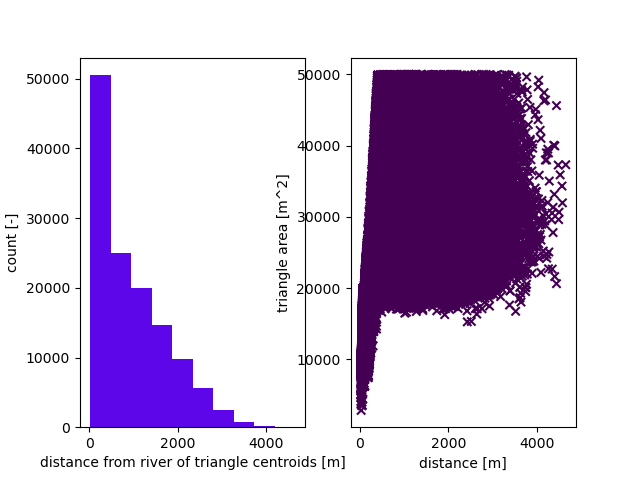

In [24]:
# triangulation
d0 = refine_d0; d1 = refine_d1
A0 = refine_A0; A1 = refine_A1 

# Refine triangles if they get too acute
min_angle = 20 # degrees

# width of reach by stream order (order:width)
widths = dict({1:10, 2:10, 3:20, 4:30, 5:30}) 

m2, area, dists = watershed_workflow.tessalateRiverAligned(watershed, rivers, river_width=widths,
                                              refine_min_angle=min_angle, refine_distance=[d0,A0,d1,A1],
                                              diagnostics=True, debug=True)


In [25]:
# get a raster for the elevation map, based on NED
dem = sources['DEM'].getDataset(watershed.exterior.buffer(100), watershed.crs)

# provide surface mesh elevations
watershed_workflow.elevate(m2, dem)

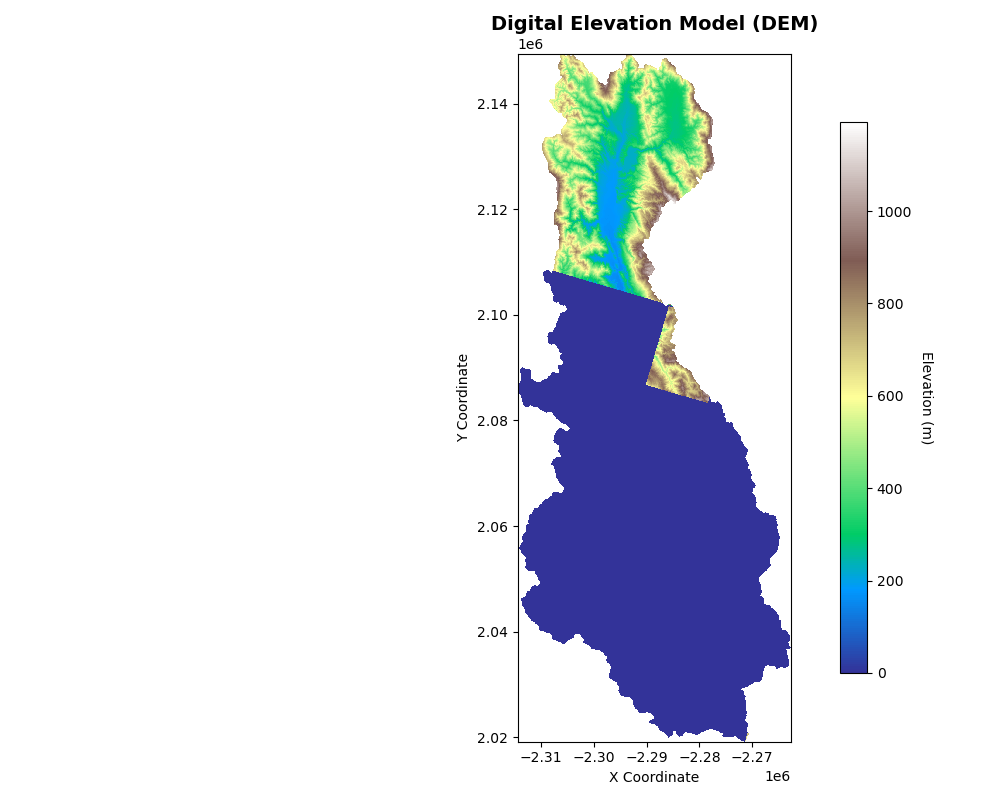

In [26]:
import matplotlib.pyplot as plt

# Plot the DEM raster
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the DEM data
im = dem.plot(ax=ax, cmap='terrain', add_colorbar=False)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label('Elevation (m)', rotation=270, labelpad=15)

# Add title and labels
ax.set_title('Digital Elevation Model (DEM)', fontsize=14, fontweight='bold')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')

# Set equal aspect ratio
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

In the pit-filling algorithm, we want to make sure that river corridor is not filled up. Hence we exclude river corridor cells from the pit-filling algorithm.

In [27]:
# hydrologically condition the mesh, removing pits
river_mask=np.zeros((len(m2.conn)))
for i, elem in enumerate(m2.conn):
    if not len(elem)==3:
        river_mask[i]=1     
watershed_workflow.condition.fillPitsDual(m2, is_waterbody=river_mask)

There are a range of options to condition river corridor mesh. We hydrologically condition the river mesh, ensuring unimpeded water flow in river corridors by globally adjusting flowlines to rectify artificial obstructions from inconsistent DEM elevations or misalignments. Please read the documentation for more information


In [28]:
# conditioning river mesh
#
# adding elevations to the river tree for stream bed conditioning
watershed_workflow.condition.setProfileByDEM(rivers, dem)

# conditioning the river mesh using NHD elevations
watershed_workflow.condition.conditionRiverMesh(m2, rivers[0])

2025-07-15 20:34:48,916 - matplotlib.axes._base - WARNING: Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


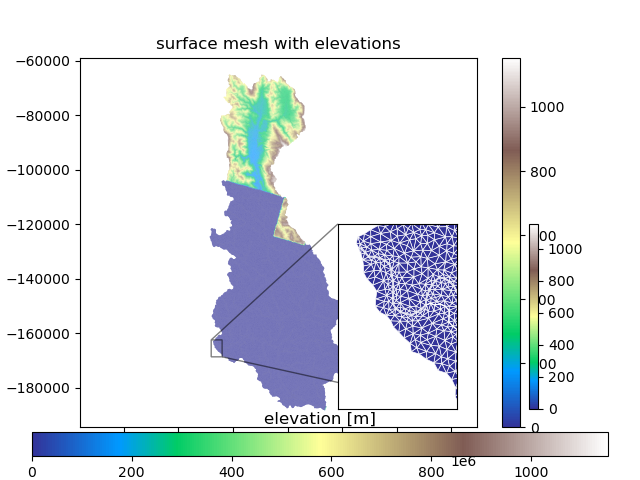

In [29]:
# plotting surface mesh with elevations
fig, ax = plt.subplots()
ax2 = ax.inset_axes([0.65,0.05,0.3,0.5])
cbax = fig.add_axes([0.05,0.05,0.9,0.05])

mp = m2.plot(facecolors='elevation', edgecolors=None, ax=ax, linewidth=0.5)
cbar = fig.colorbar(mp, orientation="horizontal", cax=cbax)
ax.set_title('surface mesh with elevations')
ax.set_aspect('equal', 'datalim')

mp2 = m2.plot(facecolors='elevation', edgecolors='white', ax=ax2)
ax2.set_aspect('equal', 'datalim')

xlim = [-1.908e6, -1.904e6]
ylim = [-168000, -163000]


ax2.set_xlim(xlim)
ax2.set_ylim(ylim)
ax2.set_xticks([])
ax2.set_yticks([])

ax.indicate_inset_zoom(ax2, edgecolor='k')

cbar.ax.set_title('elevation [m]')

plt.show()


In [30]:
# add labeled sets for subcatchments and outlets
watershed_workflow.regions.addWatershedAndOutletRegions(m2, watershed, outlet_width=stream_outlet_width, exterior_outlet=True)

# add labeled sets for river corridor cells
watershed_workflow.regions.addRiverCorridorRegions(m2, rivers)

# add labeled sets for river corridor cells by order
watershed_workflow.regions.addStreamOrderRegions(m2, rivers)

2025-07-15 20:34:50,373 - root - INFO: Adding regions for 1 polygons


In [31]:
for ls in m2.labeled_sets:
    print(f'{ls.setid} : {ls.entity} : {len(ls.ent_ids)} : "{ls.name}"')

10000 : CELL : 134891 : "Russian"
10001 : CELL : 134891 : "Russian surface"
10002 : FACE : 1544 : "Russian boundary"
10003 : FACE : 6 : "Russian outlet"
10004 : FACE : 6 : "surface domain outlet"
10005 : CELL : 5864 : "river corridor 0 surface"
10006 : CELL : 817 : "stream order 5"
10007 : CELL : 576 : "stream order 4"
10008 : CELL : 1666 : "stream order 3"
10009 : CELL : 792 : "stream order 1"
10010 : CELL : 2013 : "stream order 2"


# Surface Data

## NLCD for LULC

In [32]:
import pygeohydro # to be replaced by manager

In [33]:
nlcd = pygeohydro.nlcd_bygeom(watershed.df, years={'cover':[2019,]}, region='L48') 

In [34]:
nlcd = nlcd['18010110']['cover_2019'].astype(int)

making colormap with: [np.int64(11), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(31), np.int64(41), np.int64(42), np.int64(43), np.int64(52), np.int64(71), np.int64(81), np.int64(82), np.int64(90), np.int64(95), np.int64(127)]
making colormap with colors: [(0.27843137255, 0.41960784314, 0.62745098039), (0.86666666667, 0.78823529412, 0.78823529412), (0.84705882353, 0.57647058824, 0.50980392157), (0.92941176471, 0.0, 0.0), (0.66666666667, 0.0, 0.0), (0.69803921569, 0.67843137255, 0.63921568628), (0.40784313726, 0.66666666667, 0.38823529412), (0.10980392157, 0.38823529412, 0.18823529412), (0.70980392157, 0.78823529412, 0.5568627451), (0.8, 0.72941176471, 0.4862745098), (0.8862745098, 0.8862745098, 0.7568627451), (0.85882352941, 0.84705882353, 0.23921568628), (0.66666666667, 0.43921568628, 0.1568627451), (0.72941176471, 0.84705882353, 0.91764705882), (0.43921568628, 0.63921568628, 0.72941176471), (1.0, 1.0, 1.0)]


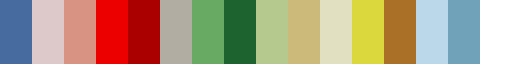

In [35]:
# create a colormap for the data
nlcd_indices, nlcd_cmap, nlcd_norm, nlcd_ticks, nlcd_labels = \
      watershed_workflow.colors.createNLCDColormap(np.unique(nlcd))
nlcd_cmap

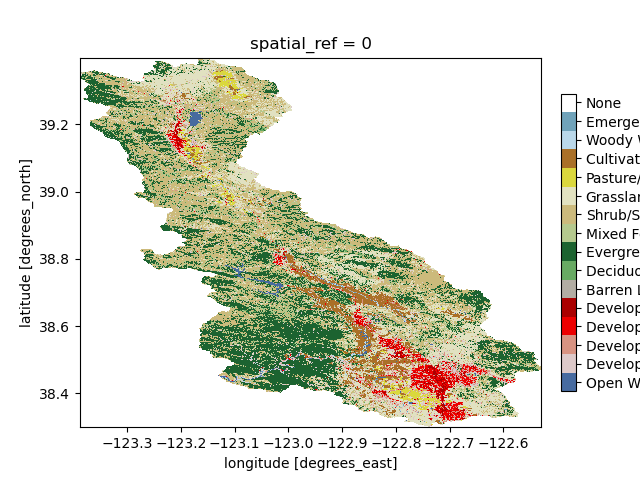

In [36]:
fig, ax = plt.subplots(1,1)
nlcd.plot.imshow(ax=ax, cmap=nlcd_cmap, norm=nlcd_norm, add_colorbar=False)
watershed_workflow.colors.createIndexedColorbar(ncolors=len(nlcd_indices), 
                               cmap=nlcd_cmap, labels=nlcd_labels, ax=ax) 
plt.show()

In [37]:
# map nlcd onto the mesh
m2_nlcd = watershed_workflow.getDatasetOnMesh(m2, nlcd, method='nearest')
m2.cell_data = pd.DataFrame({'land_cover': m2_nlcd})


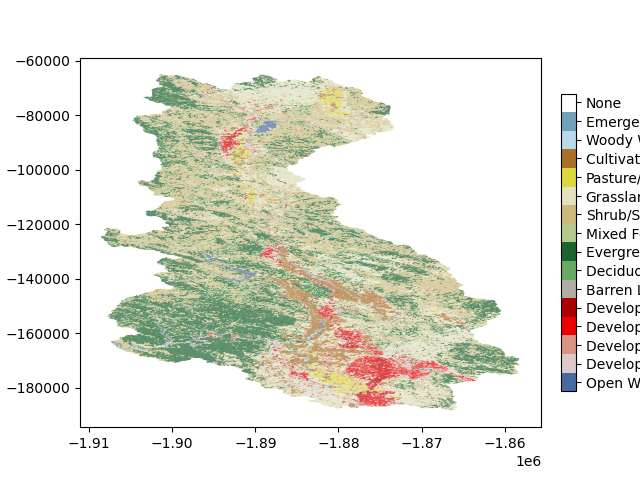

In [38]:
mp = m2.plot(facecolors=m2_nlcd, cmap=nlcd_cmap, norm=nlcd_norm, edgecolors=None, add_colorbar=False)
watershed_workflow.colors.createIndexedColorbar(ncolors=len(nlcd_indices), 
                               cmap=nlcd_cmap, labels=nlcd_labels, ax=plt.gca()) 
plt.show()

In [39]:
# add labeled sets to the mesh for NLCD
nlcd_labels_dict = dict(zip(nlcd_indices, nlcd_labels))
watershed_workflow.regions.addSurfaceRegions(m2, names=nlcd_labels_dict)

In [40]:
for ls in m2.labeled_sets:
    print(f'{ls.setid} : {ls.entity} : {len(ls.ent_ids)} : "{ls.name}"')

10000 : CELL : 134891 : "Russian"
10001 : CELL : 134891 : "Russian surface"
10002 : FACE : 1544 : "Russian boundary"
10003 : FACE : 6 : "Russian outlet"
10004 : FACE : 6 : "surface domain outlet"
10005 : CELL : 5864 : "river corridor 0 surface"
10006 : CELL : 817 : "stream order 5"
10007 : CELL : 576 : "stream order 4"
10008 : CELL : 1666 : "stream order 3"
10009 : CELL : 792 : "stream order 1"
10010 : CELL : 2013 : "stream order 2"
11 : CELL : 1687 : "Open Water"
21 : CELL : 7245 : "Developed, Open Space"
22 : CELL : 3732 : "Developed, Low Intensity"
23 : CELL : 3714 : "Developed, Medium Intensity"
24 : CELL : 1201 : "Developed, High Intensity"
31 : CELL : 279 : "Barren Land"
41 : CELL : 1765 : "Deciduous Forest"
42 : CELL : 33435 : "Evergreen Forest"
43 : CELL : 12191 : "Mixed Forest"
52 : CELL : 36077 : "Shrub/Scrub"
71 : CELL : 21733 : "Grassland/Herbaceous"
81 : CELL : 2738 : "Pasture/Hay"
82 : CELL : 7617 : "Cultivated Crops"
90 : CELL : 1214 : "Woody Wetlands"
95 : CELL : 263 : 

## MODIS LAI

In [41]:
import watershed_workflow.sources.manager_modis_appeears

In [42]:
app = watershed_workflow.sources.manager_modis_appeears.FileManagerMODISAppEEARS()


In [43]:
startdate = f'{start_year}-01-01'
enddate = f'{end_year+1}-01-01'
res = app.get_data(watershed.exterior.bounds, crs, startdate, enddate)


2025-07-15 20:34:58,319 - root - INFO: ... searching for: /Users/7s2/Research/watershed_workflow_data/land_cover/MODIS/modis_LAI_01-01-2010_01-01-2021_39.4771x-123.4803_38.2106x-122.4721.nc
2025-07-15 20:34:58,320 - root - INFO: ... searching for: /Users/7s2/Research/watershed_workflow_data/land_cover/MODIS/modis_LULC_01-01-2010_01-01-2021_39.4771x-123.4803_38.2106x-122.4721.nc


In [44]:
#res.task_id = '565bc8b6-0c0c-45ca-b2fe-055b12a8b049'
if isinstance(res, watershed_workflow.sources.manager_modis_appeears.Task):
    assert app.is_ready(res)
    modis_data = app.get_data(task=res)
else:
    modis_data = res
    
print(modis_data['LULC'].rio.crs, modis_data['LULC'].dtype)


EPSG:4269 float32


In [45]:
# remove leap day (366th day of any leap year)
for k, v in modis_data.items():
    modis_data[k] = watershed_workflow.data.filterLeapDay(v)



In [46]:
# need new start and end dates in the new calendar
startdate = cftime.datetime(start_year, 1, 1, calendar='noleap')
enddate = cftime.datetime(end_year, 12, 31, calendar='noleap')

# compute the dynamic time series
lai_df = watershed_workflow.land_cover_properties.computeTimeSeries(modis_data['LAI'], modis_data['LULC'], 
                                                                      polygon=watershed.exterior, polygon_crs=watershed.crs)

2025-07-15 20:35:02,638 - root - INFO: Writing HDF5 file: RussianRiver_LAI_MODIS_Dynamic.h5


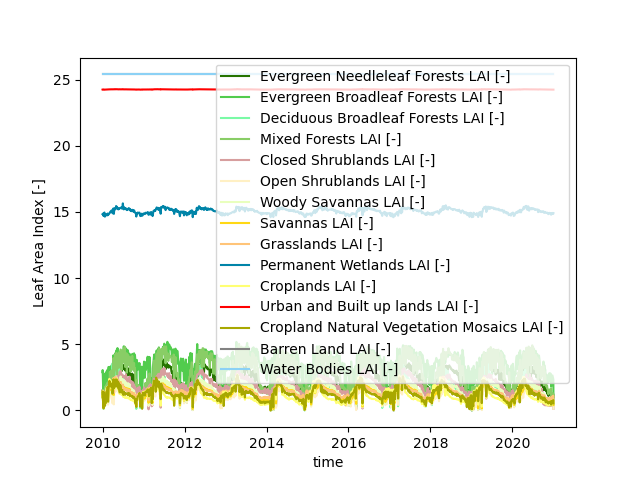

In [47]:
watershed_workflow.io.writeTimeseriesToHDF5('RussianRiver_LAI_MODIS_Dynamic.h5', lai_df)
watershed_workflow.land_cover_properties.plotLAI(lai_df, indices='MODIS')

In [48]:
lai_df

,time [datetime],Evergreen Needleleaf Forests LAI [-],Evergreen Broadleaf Forests LAI [-],Deciduous Broadleaf Forests LAI [-],Mixed Forests LAI [-],Closed Shrublands LAI [-],Open Shrublands LAI [-],Woody Savannas LAI [-],Savannas LAI [-],Grasslands LAI [-],Permanent Wetlands LAI [-],Croplands LAI [-],Urban and Built up lands LAI [-],Cropland Natural Vegetation Mosaics LAI [-],Barren Land LAI [-],Water Bodies LAI [-]
0,2009-12-31 00:00:00,1.483557,2.886434,1.271429,1.237209,1.342857,0.818699,0.964821,1.074595,1.392801,14.8400,1.009172,24.254673,0.980556,25.4,25.4
1,2010-01-01 00:00:00,1.552923,3.049628,1.471429,1.274419,1.463265,0.912195,1.041868,1.173475,1.501565,14.8700,1.462293,24.257126,1.433333,25.4,25.4
2,2010-01-05 00:00:00,0.973972,1.845278,0.957143,1.145736,1.097959,0.636585,0.697639,0.743236,1.076839,14.8200,1.052357,24.257009,1.023611,25.4,25.4
3,2010-01-09 00:00:00,0.202438,0.239439,0.114286,0.199225,0.220408,0.211382,0.218785,0.210920,0.510798,14.6950,0.154140,24.242757,0.147222,25.4,25.4
4,2010-01-13 00:00:00,1.537058,2.655123,1.371429,1.544961,1.297959,0.921951,0.975969,1.056130,1.373709,14.9000,1.290191,24.258294,1.373611,25.4,25.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1007,2020-12-19 00:00:00,1.251105,2.613394,0.842857,1.310853,0.406122,0.603252,0.736360,0.669599,1.005008,14.9125,0.607516,24.252453,0.712500,25.4,25.4
1008,2020-12-23 00:00:00,1.274964,2.642702,0.742857,1.144186,0.391837,0.660163,0.805887,0.731933,1.062285,14.8650,0.636688,24.252804,0.700000,25.4,25.4
1009,2020-12-27 00:00:00,1.250919,2.501202,0.928571,1.296124,0.369388,0.667480,0.767458,0.717993,1.064006,14.8950,0.704968,24.253505,0.750000,25.4,25.4
1010,2020-12-31 00:00:00,1.170523,2.346308,0.914286,1.268217,0.367347,0.650407,0.816599,0.772900,1.109233,14.8650,0.724204,24.252220,0.776389,25.4,25.4


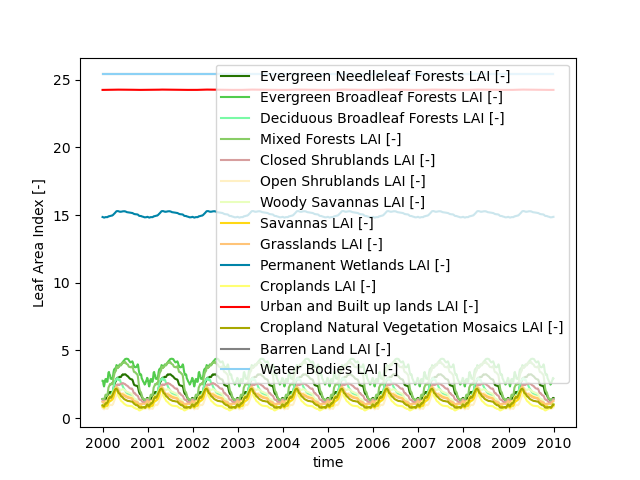

In [49]:
lai_smoothed = watershed_workflow.data.smoothTimeSeries(lai_df, 'time [datetime]')
lai_typical_df = watershed_workflow.data.computeAverageYear(lai_smoothed, 'time [datetime]', output_nyears=10, 
                                                                  start_year=2000)
watershed_workflow.land_cover_properties.plotLAI(lai_typical_df, indices='MODIS')

## Crosswalk of LAI to NLCD LC

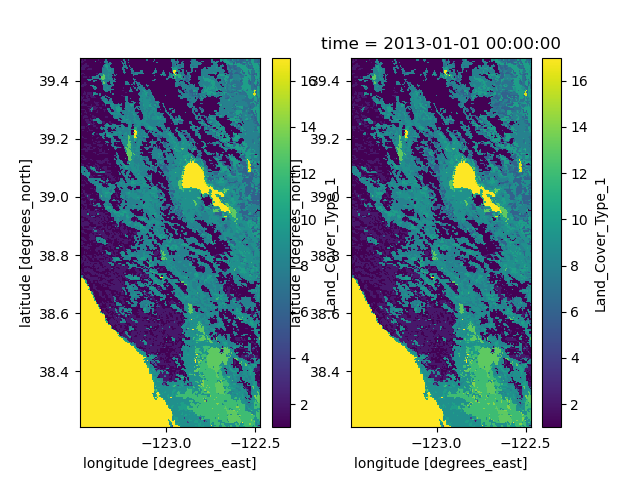

In [50]:
modis_lulc_mode = watershed_workflow.data.computeMode(modis_data['LULC'])

fig, ax = plt.subplots(1,2)
modis_lulc_mode.plot.imshow(ax=ax[0])
modis_data['LULC'][3].plot.imshow(ax=ax[1])
plt.show()

In [51]:
print(watershed_workflow.crs.from_xarray(modis_data['LULC']))
print(watershed_workflow.crs.from_xarray(modis_lulc_mode))

EPSG:4269
EPSG:4269


2025-07-15 20:35:05,175 - root - INFO: Compute the crosswalk between MODIS and NLCD:
2025-07-15 20:35:05,176 - root - INFO:   unique MODIS: [np.float64(1.0), np.float64(2.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.0), np.float64(16.0), np.float64(17.0)]
2025-07-15 20:35:05,176 - root - INFO:   unique NLCD: [np.int64(11), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(31), np.int64(41), np.int64(42), np.int64(43), np.int64(52), np.int64(71), np.int64(81), np.int64(82), np.int64(90), np.int64(95)]


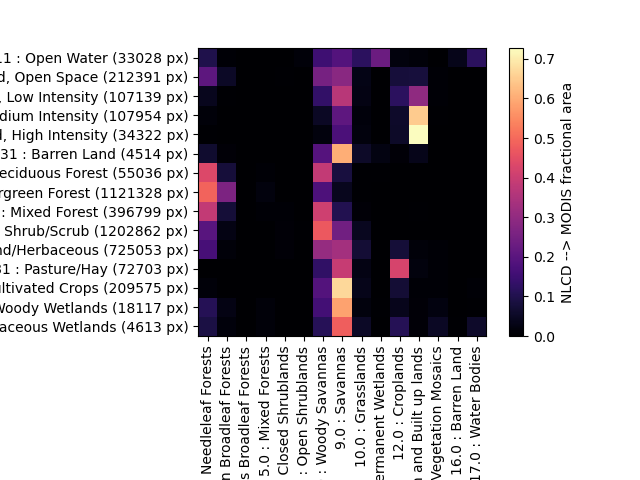

In [52]:
cw = watershed_workflow.land_cover_properties.computeCrosswalk(modis_lulc_mode, nlcd, method='fractional area')

In [53]:
# Compute the NLCD-based time series
nlcd_lai = watershed_workflow.land_cover_properties.applyCrosswalk(cw, lai_typical_df)
watershed_workflow.land_cover_properties.removeNullLAI(nlcd_lai)
nlcd_lai

None LAI [-] False
Open Water LAI [-] True
Perrenial Ice/Snow LAI [-] False
Developed, Medium Intensity LAI [-] True
Developed, High Intensity LAI [-] True
Barren Land LAI [-] True


,time [datetime],Open Water LAI [-],"Developed, Open Space LAI [-]","Developed, Low Intensity LAI [-]","Developed, Medium Intensity LAI [-]","Developed, High Intensity LAI [-]",Barren Land LAI [-],Deciduous Forest LAI [-],Evergreen Forest LAI [-],Mixed Forest LAI [-],Shrub/Scrub LAI [-],Grassland/Herbaceous LAI [-],Pasture/Hay LAI [-],Cultivated Crops LAI [-],Woody Wetlands LAI [-],Emergent Herbaceous Wetlands LAI [-]
0,2000-01-01 00:00:00,0.0,2.964376,7.863189,0.0,0.0,0.0,1.337980,1.672496,1.314670,1.077547,1.288847,1.347941,1.202874,1.426855,2.803403
1,2000-01-05 00:00:00,0.0,2.971243,7.865928,0.0,0.0,0.0,1.350076,1.683271,1.326092,1.086298,1.295821,1.348215,1.206947,1.432559,2.807083
2,2000-01-09 00:00:00,0.0,2.891858,7.820239,0.0,0.0,0.0,1.246533,1.537467,1.225338,1.005401,1.221649,1.293478,1.144999,1.359697,2.742533
3,2000-01-13 00:00:00,0.0,2.844153,7.794744,0.0,0.0,0.0,1.180369,1.452533,1.160943,0.952458,1.176045,1.269837,1.108169,1.316482,2.707039
4,2000-01-17 00:00:00,0.0,2.894543,7.830792,0.0,0.0,0.0,1.235605,1.535455,1.214802,0.996293,1.223336,1.330560,1.152172,1.365071,2.756883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
915,2009-12-15 00:00:00,0.0,2.887867,7.797029,0.0,0.0,0.0,1.268964,1.590956,1.245031,1.006010,1.208030,1.237699,1.115863,1.342639,2.716227
916,2009-12-19 00:00:00,0.0,2.927077,7.829224,0.0,0.0,0.0,1.305273,1.644305,1.281433,1.040622,1.246909,1.291010,1.158122,1.384612,2.759079
917,2009-12-23 00:00:00,0.0,2.968274,7.862819,0.0,0.0,0.0,1.345826,1.690606,1.322024,1.080566,1.289885,1.346152,1.201618,1.427225,2.802827
918,2009-12-27 00:00:00,0.0,3.031306,7.905387,0.0,0.0,0.0,1.419902,1.785064,1.394977,1.144602,1.352462,1.405391,1.258525,1.488683,2.860962


# Subsurface Soil, Geologic Structure

## NRCS Soils

In [54]:
import watershed_workflow.sources.manager_nrcs

In [55]:
nrcs_manager = watershed_workflow.sources.manager_nrcs.FileManagerNRCS()

In [56]:
# get NRCS shapes, on a reasonable crs
nrcs_shps = nrcs_manager.get_shapes(watershed.exterior.bounds, watershed.crs).to_crs(crs)


2025-07-15 20:35:06,511 - root - INFO: Attempting to download source for target '/Users/7s2/Research/watershed_workflow_data/soil_structure/SSURGO/SSURGO_-123.4704_38.2205_-122.4820_39.4672.shp'
2025-07-15 20:35:06,650 - root - INFO:   Found 20450 shapes.


In [57]:
nrcs_shps

,mukey,geometry
0,459605,"POLYGON ((-1867247.856 -66808.346, -1867269.26..."
1,459622,"POLYGON ((-1849086.379 -143377.645, -1849103.9..."
2,459526,"POLYGON ((-1855757.762 -138003.094, -1855758.7..."
3,459595,"POLYGON ((-1845152.537 -139257.002, -1845155.0..."
4,459579,"POLYGON ((-1850144.01 -111905.811, -1850158.62..."
...,...,...
20445,461117,"POLYGON ((-1899524.195 -81412.032, -1899551.41..."
20446,461031,"POLYGON ((-1879058.731 -83679.089, -1879077.68..."
20447,458746,"POLYGON ((-1832346.791 -73497.085, -1832393.69..."
20448,458638,"POLYGON ((-1843404.606 -78183.043, -1843401.41..."


In [59]:
nrcs_props = nrcs_manager.get_properties(nrcs_shps['mukey'].unique(), './russian_river_nrcs_properties.csv')
nrcs_props

2025-07-15 21:15:01,668 - root - INFO: found 43 unique MUKEYs.
2025-07-15 21:15:01,965 - root - INFO: Running Rosetta for van Genutchen parameters
2025-07-15 21:15:02,035 - root - INFO:   ... done
2025-07-15 21:15:02,037 - root - INFO:   requested 43 values
2025-07-15 21:15:02,037 - root - INFO:   got 43 responses


,mukey,residual saturation [-],Rosetta porosity [-],van Genuchten alpha [Pa^-1],van Genuchten n [-],Rosetta permeability [m^2],thickness [cm],permeability [m^2],porosity [-],bulk density [g/cm^3],total sand pct [%],total silt pct [%],total clay pct [%],source
0,459605,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,459622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,459526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,459595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,459579,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,1607629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
998,1607426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
999,458731,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000,3416823,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
# create a clean dataframe with just the data we will need for ATS
soil_props = nrcs_props.rename(columns={'mukey':'ID'})
soil_props.set_index('ID', drop=True, inplace=True)

# convert thickness to [m]
soil_props['thickness [cm]'] = soil_props['thickness [cm]'] / 100.
soil_props.rename(columns={'thickness [cm]' : 'thickness [m]'}, inplace=True)


def replace_column_nans(df, col_nan, col_replacement):
    """In a df, replace col_nan entries by col_replacement if is nan.  In Place!"""
    row_indexer = df[col_nan].isna()
    df.loc[row_indexer, col_nan] = df.loc[row_indexer, col_replacement]
    return

# where poro or perm is nan, put Rosetta poro
replace_column_nans(soil_props, 'porosity [-]', 'Rosetta porosity [-]')
replace_column_nans(soil_props, 'permeability [m^2]', 'Rosetta permeability [m^2]')

# drop unnecessary columns
for col in ['Rosetta porosity [-]', 'Rosetta permeability [m^2]', 'bulk density [g/cm^3]', 'total sand pct [%]',
            'total silt pct [%]', 'total clay pct [%]']:
    soil_props.pop(col)
    
# drop nans
nan_mask = soil_props.isna().any(axis=1)
dropped_mukeys = soil_props.index[nan_mask]

# Drop those rows
soil_props = soil_props[~nan_mask]

# also drop shapes with that mukey
soil_shps = nrcs_shps.reset_index()
soil_shps.rename(columns={'mukey':'ID'}, inplace=True)
soil_shps = soil_shps[~soil_shps['ID'].isin(dropped_mukeys)]

# assert soil_props['porosity [-]'][:].min() >= min_porosity
# assert soil_props['permeability [m^2]'][:].max() <= max_permeability
soil_props

# check for nans
soil_props.isna().any()

residual saturation [-]        False
van Genuchten alpha [Pa^-1]    False
van Genuchten n [-]            False
thickness [m]                  False
permeability [m^2]             False
porosity [-]                   False
source                         False
dtype: bool

In [115]:
# Compute the soil color of each cell of the mesh
soil_color_mukey = watershed_workflow.getShapePropertiesOnMesh(m2, soil_shps, 'ID', 
                                                         resolution=50, nodata=-999)

unique_soil_colors = list(np.unique(soil_color_mukey))
unique_soil_colors.remove(-999)

# retain only the unique values of soil_color
soil_props = soil_props.loc[unique_soil_colors]

# renumber the ones we know will appear with an ATS ID using ATS conventions
soil_props['ATS ID'] = range(1000, 1000+len(soil_props))
soil_props.reset_index(drop=False, inplace=True)
soil_props.set_index('ATS ID', drop=True, inplace=True)

# create a new soil color and a soil thickness map using the ATS IDs
soil_color = -np.ones_like(soil_color_mukey)
soil_thickness = np.nan * np.ones(soil_color.shape, 'd')

for ats_ID, ID, thickness in zip(soil_props.index, soil_props.ID, soil_props['thickness [m]']):
    mask = np.where(soil_color_mukey == ID)
    soil_thickness[mask] = thickness
    soil_color[mask] = ats_ID

m2.cell_data['soil_color'] = soil_color
m2.cell_data['soil thickness'] = soil_thickness


ValueError: GeoDataFrame is empty

In [60]:
print(soil_color.min())

-1


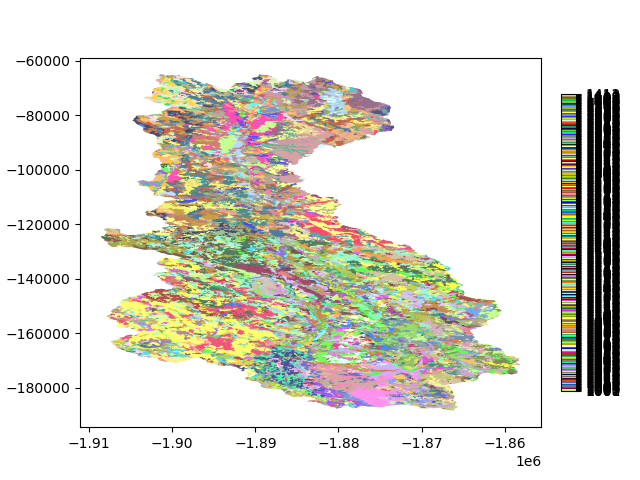

In [61]:
# plot the soil color
# -- get a cmap for soil color
sc_indices, sc_cmap, sc_norm, sc_ticks, sc_labels = \
      watershed_workflow.colors.createIndexedColormap(soil_props.index)

mp = m2.plot(facecolors=m2.cell_data['soil_color'], cmap=sc_cmap, norm=sc_norm, edgecolors=None, add_colorbar=False)
watershed_workflow.colors.createIndexedColorbar(ncolors=len(soil_props), 
                               cmap=sc_cmap, labels=sc_labels, ax=plt.gca()) 
plt.show()

## Depth to Bedrock from Pelletier

In [62]:
import watershed_workflow.sources.manager_pelletier_dtb
dtb_manager = watershed_workflow.sources.manager_pelletier_dtb.ManagerPelletierDTB()

In [63]:
dtb = dtb_manager.getDataset(watershed.exterior, watershed.crs)

2025-07-01 15:06:48,218 - root - INFO: Getting raster of Pelletier DTB on bounds: (-1908558.9552878388, -188259.4746806996, -1858137.930838771, -64990.5940664628)
2025-07-01 15:06:48,218 - root - INFO:   from file: /home/ecoon/code/watershed_workflow/data/soil_structure/PelletierDTB/Global_Soil_Regolith_Sediment_1304/data/average_soil_and_sedimentary-deposit_thickness.tif


In [64]:
# map to the mesh
m2.cell_data['dtb'] = watershed_workflow.getDatasetOnMesh(m2, dtb, method='linear')


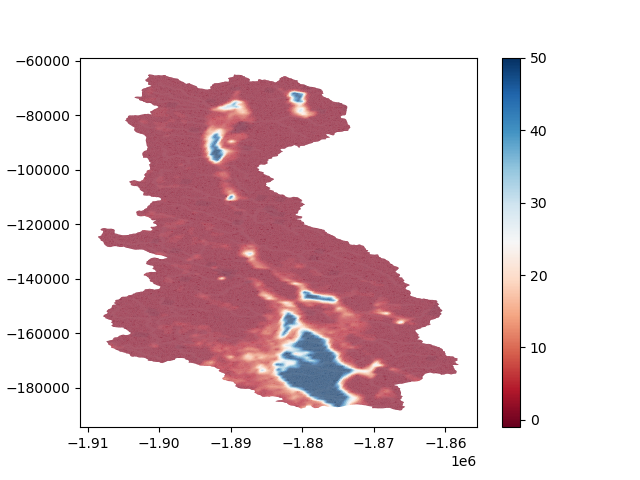

In [65]:
gons = m2.plot(facecolors=m2.cell_data['dtb'], cmap='RdBu', edgecolors=None)
plt.show()

## GLHYMPs Geology

In [66]:
import watershed_workflow.sources.manager_glhymps
glhymps_manager = watershed_workflow.sources.manager_glhymps.ManagerGLHYMPS()

In [ ]:
glhymps = glhymps_manager.getShapesByGeometry(watershed.exterior.buffer(1000), watershed.crs, 
                                              min_porosity=min_porosity, 
                                              max_permeability=max_permeability, 
                                              max_vg_alpha=max_vg_alpha)

# convert to the right geometry (this should be done in a call to ww.getShapesByGeometry()!
glhymps = glhymps.to_crs(watershed.crs)

# intersect with the buffered geometry -- don't keep extras
glhymps['geometry'] = glhymps.intersection(watershed.exterior.buffer(10))


2025-07-01 15:06:49,627 - root - INFO:   from file: /home/ecoon/code/watershed_workflow/data/soil_structure/GLHYMPS/GLHYMPS.shp


In [ ]:
# quality check -- make sure glymps shapes cover the watershed

# it doesn't contain!
print(glhymps.union_all().contains(watershed.exterior))
glhymps

In [ ]:
# plot -- what is going on (probably something at the coast?)
m = watershed.explore(column=None, facecolor='b', zorder=1)
m = glhymps.explore(column=None, color='grey', m=m, zorder=3)

diff = watershed.exterior.difference(glhymps.union_all())
gdf_diff = gpd.GeoDataFrame(geometry=[diff,], crs=watershed.crs)
m = gdf_diff.explore(column=None, facecolor='r', edgecolor='r', m=m, zorder=5)

m = watershed_workflow.makeMap(m) 
m


In [ ]:
# note the missing data at the coast, it looks like it should be a continuation of GLHYMPS ID 357
glhymps.loc[357, 'geometry'] = shapely.unary_union([diff, glhymps.loc[357, 'geometry']])

In [ ]:
glhymps

In [ ]:
# clean the data
geology_props = glhymps.rename(columns={'id' : 'ID'})

geology_props.pop('logk_stdev [-]')

assert geology_props['porosity [-]'][:].min() >= min_porosity
assert geology_props['permeability [m^2]'][:].max() <= max_permeability
assert geology_props['van Genuchten alpha [Pa^-1]'][:].max() <= max_vg_alpha

geology_props.isna().any()

In [ ]:
# note that for larger areas there are often common regions -- two labels with the same properties -- no need to duplicate those with identical values.
def reindex_remove_duplicates(df, index):
    """Removes duplicates, creating a new index and saving the old index as tuples of duplicate values. In place!"""
    if index is not None:
        if index in df:
            df.set_index(index, drop=True, inplace=True)
    
    index_name = df.index.name

    # identify duplicate rows
    duplicates = list(df.groupby(list(df)).apply(lambda x: tuple(x.index)))

    # order is preserved
    df.drop_duplicates(inplace=True)
    df.reset_index(inplace=True)
    df[index_name] = duplicates
    return

reindex_remove_duplicates(geology_props, 'ID')
geology_props

In [ ]:
# Compute the geo color of each cell of the mesh
geology_color_glhymps = watershed_workflow.getShapePropertiesOnMesh(m2, geology_props, 'index', 
                                                         resolution=50, nodata=-999)

# retain only the unique values of geology that actually appear in our cell mesh
unique_geology_colors = list(np.unique(geology_color_glhymps))
unique_geology_colors.remove(-999)

# retain only the unique values of geology_color
geology_props = geology_props.loc[unique_geology_colors]

# renumber the ones we know will appear with an ATS ID using ATS conventions
geology_props['ATS ID'] = range(100, 100+len(geology_props))
geology_props['TMP_ID'] = geology_props.index
geology_props.reset_index(drop=True, inplace=True)
geology_props.set_index('ATS ID', drop=True, inplace=True)

# create a new geology color using the ATS IDs
geology_color = -np.ones_like(geology_color_glhymps)
for ats_ID, tmp_ID in zip(geology_props.index, geology_props.TMP_ID):
    geology_color[np.where(geology_color_glhymps == tmp_ID)] = ats_ID

geology_props.pop('TMP_ID')

m2.cell_data['geology_color'] = geology_color
                             


In [ ]:
print(geology_color.min())

## Combine to form a complete subsurface dataset

In [ ]:
bedrock_props = watershed_workflow.soil_properties.getDefaultBedrockProperties()

# merge the properties databases
subsurface_props = pd.concat([geology_props,
                                  soil_props,
                                  bedrock_props])

# save the properties to disk for use in generating input file
outputs['subsurface_properties_filename'] = os.path.join(f'{name}_subsurface_properties.csv')
subsurface_props.to_csv(outputs['subsurface_properties_filename'])
subsurface_props


# Extrude the 2D Mesh to make a 3D mesh

In [ ]:
# set the floor of the domain as max DTB
dtb_max = np.nanmax(m2.cell_data['dtb'].values)
m2.cell_data['dtb'] = m2.cell_data['dtb'].fillna(dtb_max)

print(f'total thickness: {dtb_max} m')
total_thickness = 50.


In [ ]:
# Generate a dz structure for the top 2m of soil
#
# here we try for 10 cells, starting at 5cm at the top and going to 50cm at the bottom of the 2m thick soil
dzs, res = watershed_workflow.mesh.optimizeDzs(0.05, 0.5, 2, 10)
print(dzs)
print(sum(dzs))

In [ ]:
# this looks like it would work out, with rounder numbers:
dzs_soil = [0.05, 0.05, 0.05, 0.12, 0.23, 0.5, 0.5, 0.5]
print(sum(dzs_soil))

In [ ]:
# 50m total thickness, minus 2m soil thickness, leaves us with 48 meters to make up.
# optimize again...
dzs2, res2 = watershed_workflow.mesh.optimizeDzs(1, 10, 48, 8)
print(dzs2)
print(sum(dzs2))

# how about...
dzs_geo = [1.0, 2.0, 4.0, 8.0, 11, 11, 11]
print(dzs_geo)
print(sum(dzs_geo))

In [ ]:
# layer extrusion
DTB = m2.cell_data['dtb'].values
soil_color = m2.cell_data['soil_color'].values
geo_color = m2.cell_data['geology_color'].values
soil_thickness = m2.cell_data['soil thickness'].values


# -- data structures needed for extrusion
layer_types = []
layer_data = []
layer_ncells = []
layer_mat_ids = []

# -- soil layer --
depth = 0
for dz in dzs_soil:
    depth += 0.5 * dz
    layer_types.append('constant')
    layer_data.append(dz)
    layer_ncells.append(1)
    
    # use glhymps params
    br_or_geo = np.where(depth < DTB, geo_color, 999)
    soil_or_br_or_geo = np.where(np.bitwise_and(soil_color > 0, depth < soil_thickness),
                                 soil_color,
                                 br_or_geo)

    layer_mat_ids.append(soil_or_br_or_geo)
    depth += 0.5 * dz
    
# -- geologic layer --
for dz in dzs_geo:
    depth += 0.5 * dz
    layer_types.append('constant')
    layer_data.append(dz)
    layer_ncells.append(1)
    
    geo_or_br = np.where(depth < DTB, geo_color, 999)

    layer_mat_ids.append(geo_or_br)
    depth += 0.5 * dz

# print the summary
watershed_workflow.mesh.Mesh3D.summarizeExtrusion(layer_types, layer_data, 
                                            layer_ncells, layer_mat_ids)

# downselect subsurface properties to only those that are used
layer_mat_id_used = list(np.unique(np.array(layer_mat_ids)))
subsurface_props_used = subsurface_props.loc[layer_mat_id_used]
len(subsurface_props_used)


In [ ]:
geo_color